In [20]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import math
import scipy.spatial.distance as dist
from scipy.signal import convolve2d

In [2]:
path_tmpl = 'trees/' + 'tree%d.jpg'

# Load images
paths = [path_tmpl % i for i in range(1,11)]
imgs = [cv.imread(path) for path in paths]
imgs = [cv.resize(img, (500, 500), interpolation = cv.INTER_AREA) for img in imgs]

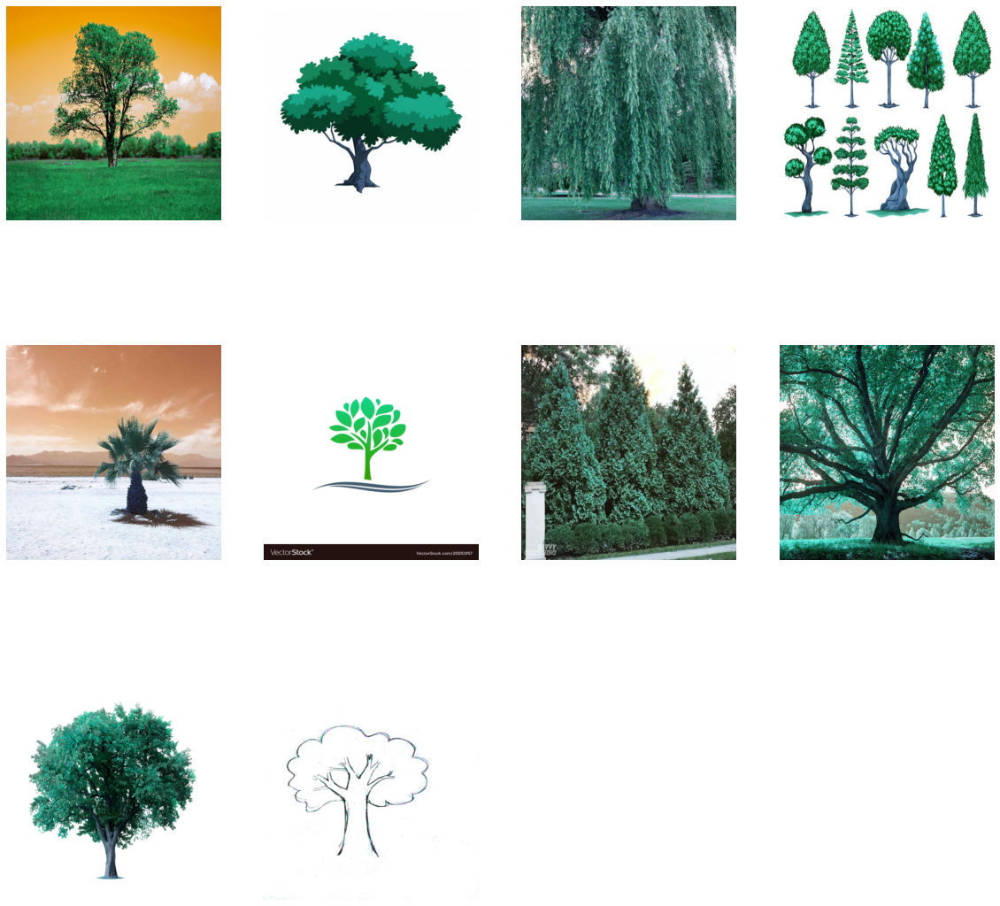

In [3]:
plt.figure(figsize=(20, 20))
for i, img in enumerate(imgs, 1):
    ax = plt.subplot(3, 4, i)
    plt.imshow(img)
    plt.axis("off")

In [38]:
def takeSecond(elem):
    return elem[1]

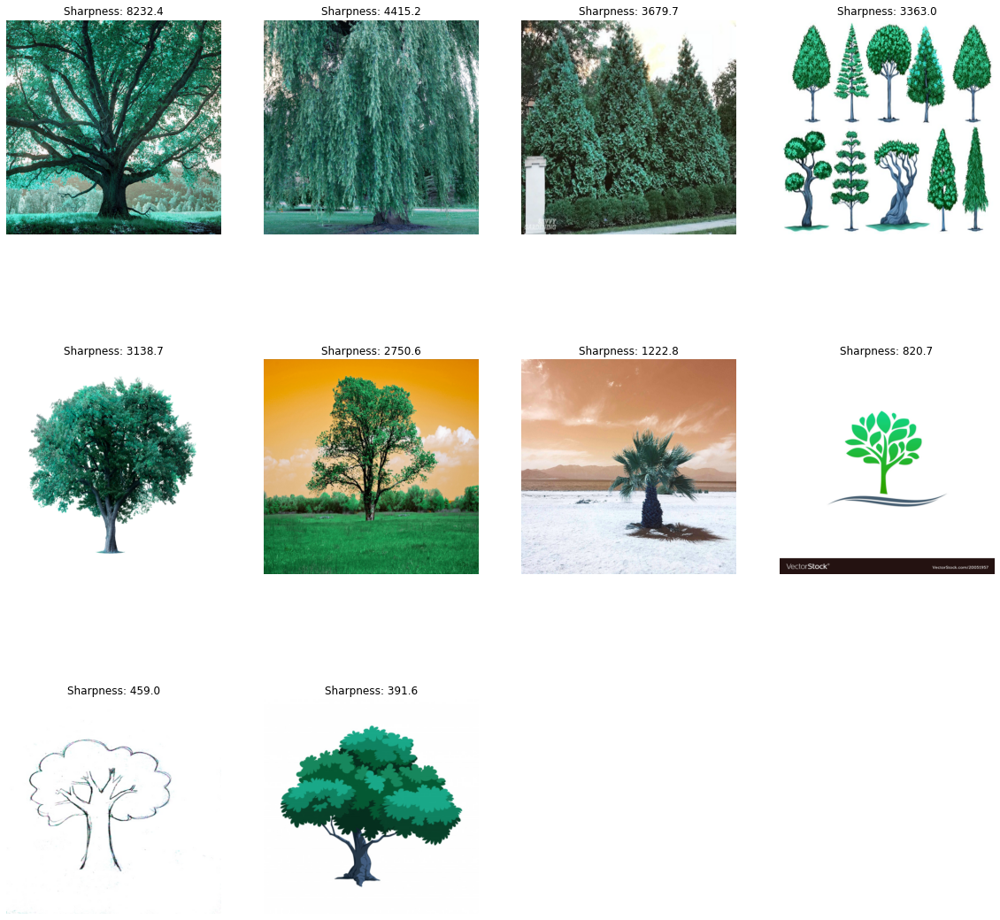

In [64]:
# Measure sharpness
sharpness_score = [(img, round(cv.Laplacian(img, cv.CV_64F).var(), 1)) for img in imgs]
sharpness_score.sort(key=takeSecond, reverse=True)

plt.figure(figsize=(20, 20))
for i, elem in enumerate(sharpness_score, 1):
    ax = plt.subplot(3, 4, i)
    img, score = elem
    plt.imshow(img)
    plt.title("Sharpness: " + str(score))
    plt.axis("off")

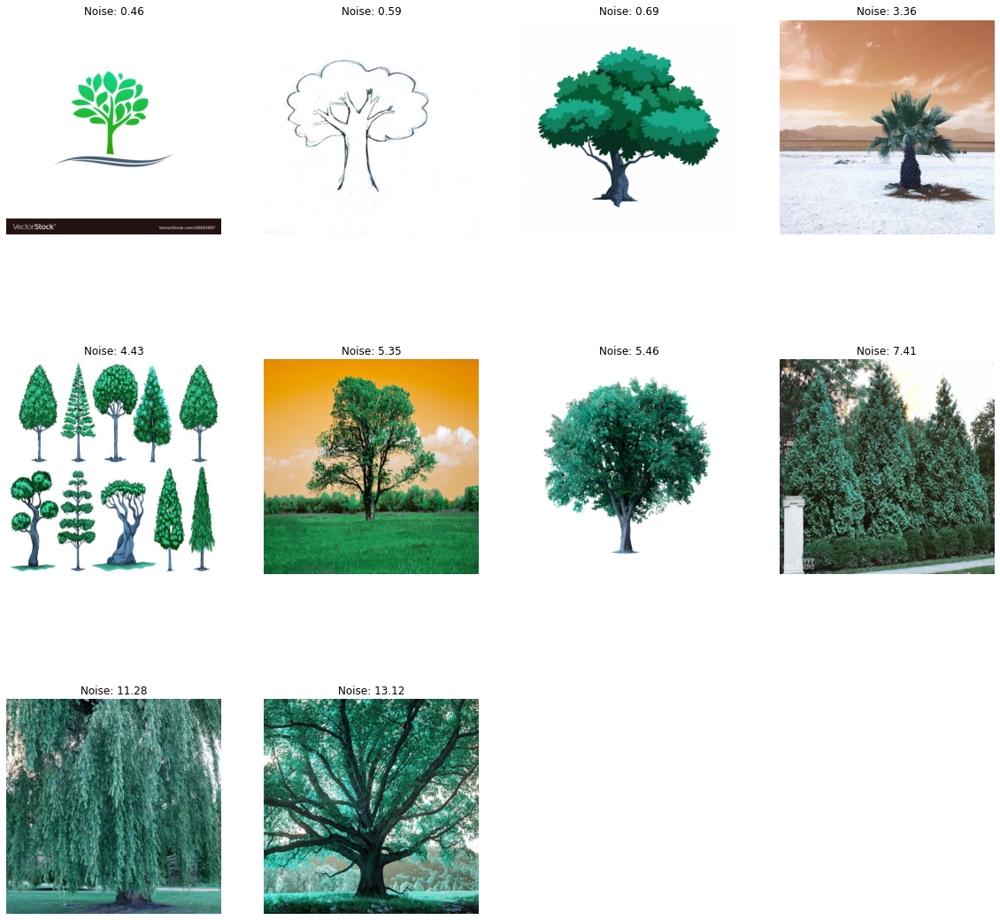

In [63]:
# Measure noise
def estimate_noise(Image):

  H, W = Image.shape

  M = [[1, -2, 1],
       [-2, 4, -2],
       [1, -2, 1]]

  sigma = np.sum(np.sum(np.absolute(convolve2d(Image, M))))
  sigma = sigma * math.sqrt(0.5 * math.pi) / (6 * (W-2) * (H-2))

  return sigma

imgs_gray = [cv.cvtColor(img, cv.COLOR_BGR2GRAY) for img in imgs]
noise = [estimate_noise(np.array(img)) for img in imgs_gray]
noise_score = [(imgs[i], round(noise[i], 2)) for i in range(len(imgs))]
noise_score.sort(key=takeSecond)

plt.figure(figsize=(20, 20))
for i, elem in enumerate(noise_score, 1):
    ax = plt.subplot(3, 4, i)
    img, score = elem
    plt.imshow(img)
    plt.title("Noise: " + str(score))
    plt.axis("off")

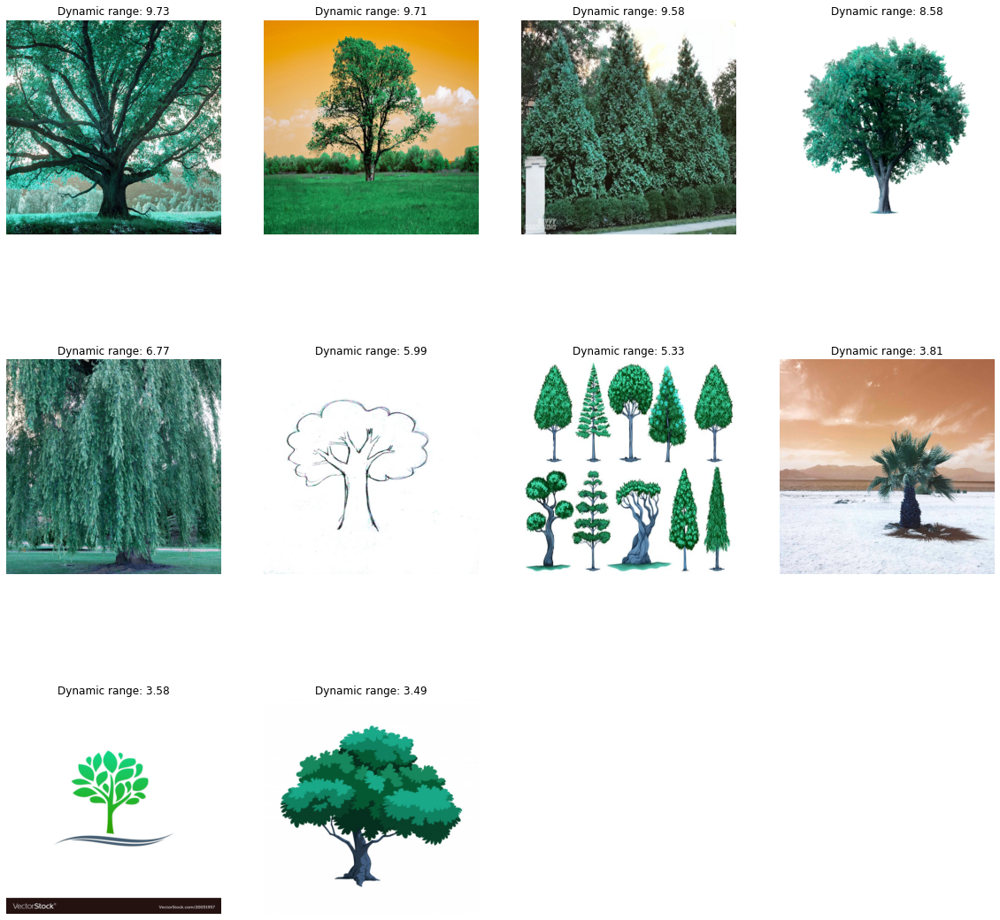

In [45]:
# Measure dynamic range
def dynamic_range(Image):
    
    pixel_brightness = []
    for x in range(500):
        for y in range(500):
            pixel = Image[x,y]
            R, G, B = pixel
            brightness = max(sum([R,G,B])/3, 0.3) # choose 0.3 as the smallest value since log(0) is not valid
            pixel_brightness.append(brightness)
    dyn_range = round(np.log2(max(pixel_brightness))-np.log2(min((pixel_brightness))), 2)

    return dyn_range

dynamic_range = [(img, dynamic_range(img)) for img in imgs]
dynamic_range.sort(key=takeSecond, reverse=True)

plt.figure(figsize=(20, 20))
for i, elem in enumerate(dynamic_range, 1):
    ax = plt.subplot(3, 4, i)
    img, score = elem
    plt.imshow(img)
    plt.title("Dynamic range: " + str(score))
    plt.axis("off")

In [7]:
# Tone reproduction
pass

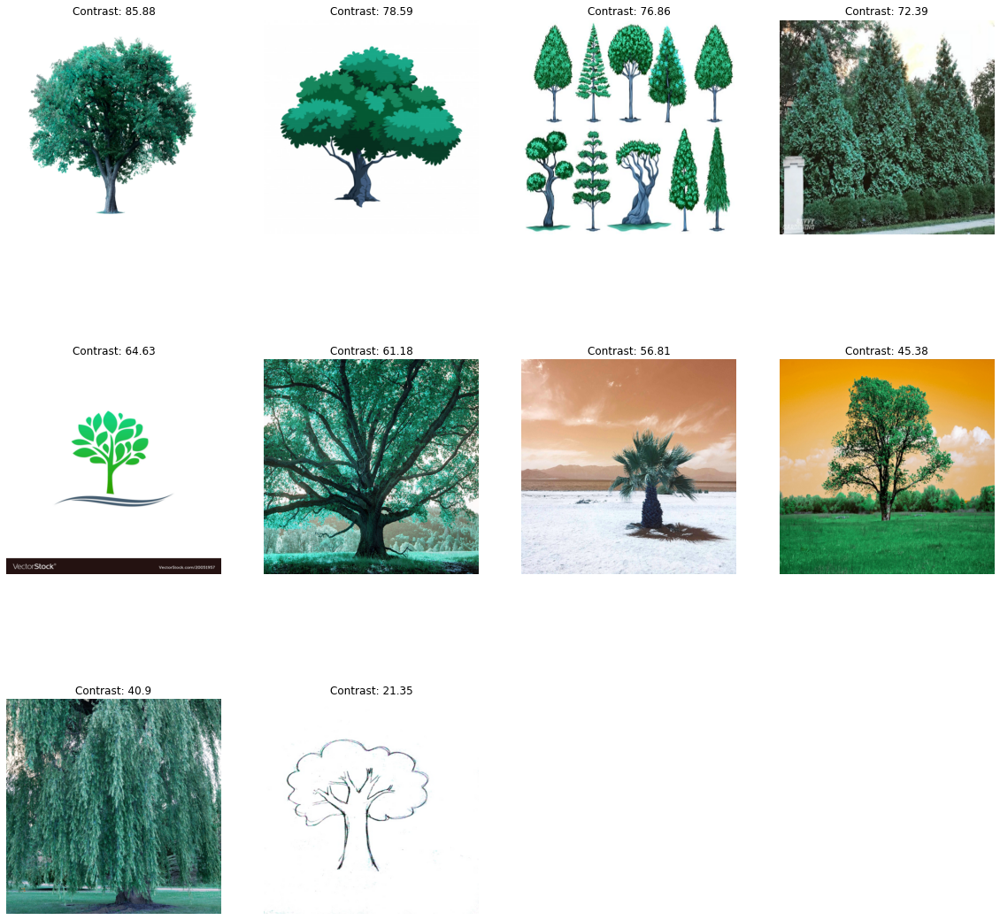

In [62]:
# Measure contrast
imgs_gray = [cv.cvtColor(img, cv.COLOR_BGR2GRAY) for img in imgs]
contrast_gray = [img.std() for img in imgs_gray]
contrast = [(imgs[i], round(contrast_gray[i], 2)) for i in range(len(imgs))]
contrast.sort(key=takeSecond, reverse=True)

plt.figure(figsize=(20, 20))
for i, elem in enumerate(contrast, 1):
    ax = plt.subplot(3, 4, i)
    img, score = elem
    plt.imshow(img)
    plt.title("Contrast: " + str(score))
    plt.axis("off")

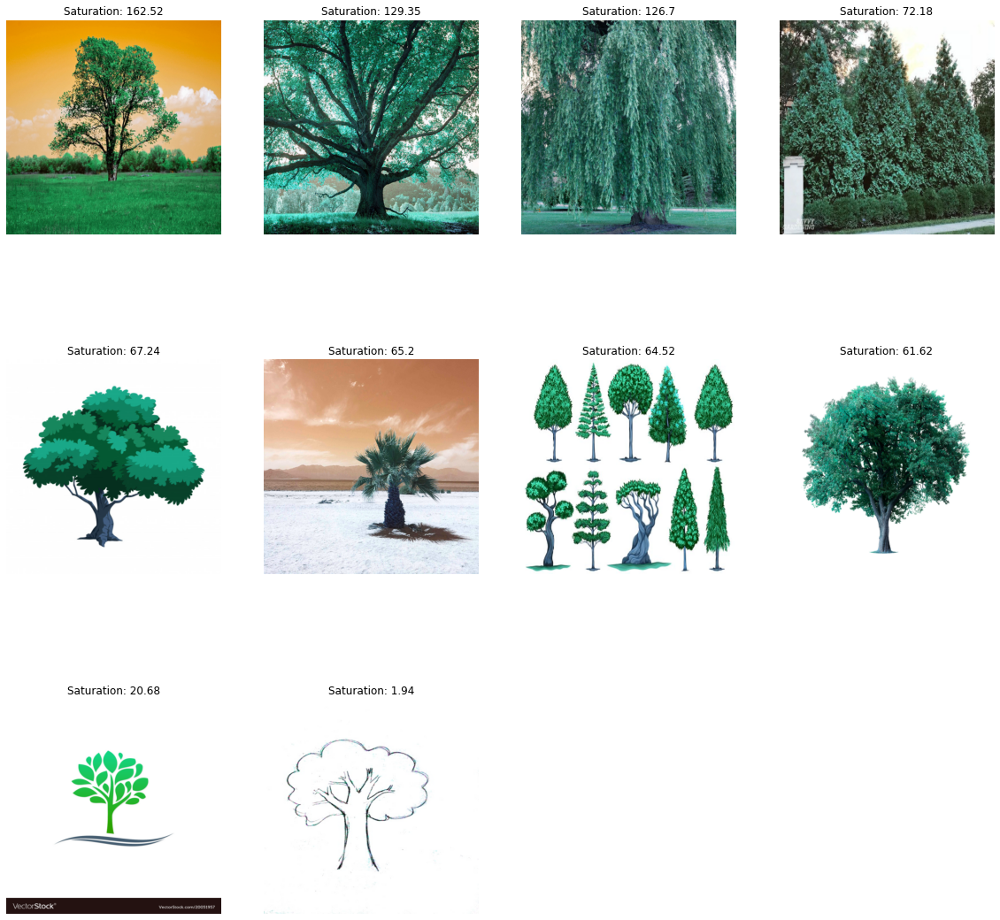

In [61]:
# Measure color accuracy
# Measure color shifts
pass

# Measure saturation
imgs_hsv = [cv.cvtColor(img, cv.COLOR_BGR2HSV) for img in imgs]
saturation_hsv = [img[:, :, 1].mean() for img in imgs_hsv]
saturation = [(imgs[i], round(saturation_hsv[i], 2)) for i in range(len(imgs))]
saturation.sort(key=takeSecond, reverse=True)

plt.figure(figsize=(20, 20))
for i, elem in enumerate(saturation, 1):
    ax = plt.subplot(3, 4, i)
    img, score = elem
    plt.imshow(img)
    plt.title("Saturation: " + str(score))
    plt.axis("off")
    
# Measure white balance efficiency
pass

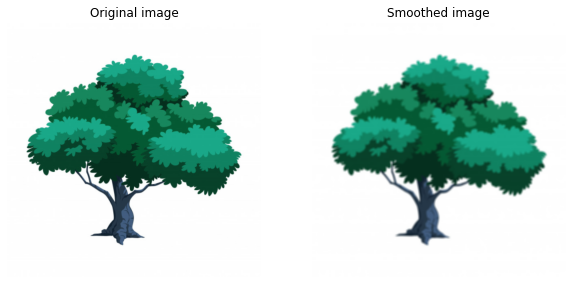

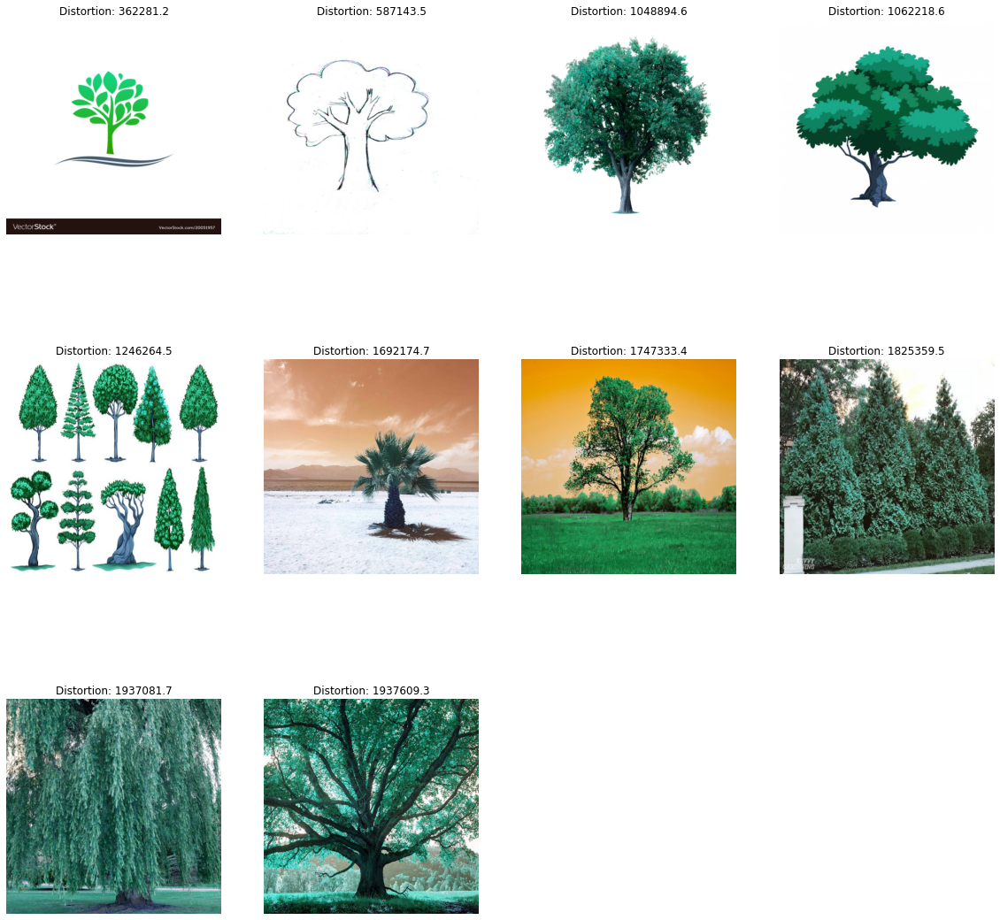

In [48]:
# Measure distortion
# Smoothing the images
kernel = np.ones((5,5),np.float32)/25
dsts = [cv.filter2D(img,-1,kernel) for img in imgs]

plt.figure(figsize=(10, 5))
ax = plt.subplot(1, 2, 1)
plt.imshow(imgs[1])
plt.title("Original image")
plt.axis("off")
ax = plt.subplot(1, 2, 2)
plt.imshow(dsts[1])
plt.title("Smoothed image")
plt.axis("off")

# Calculate distortion as difference between original and smoothed images
distortion = []
imgs_gray = [cv.cvtColor(img, cv.COLOR_BGR2GRAY) for img in imgs]
dsts_gray = [cv.cvtColor(dst, cv.COLOR_BGR2GRAY) for dst in dsts]
for i, img in enumerate(imgs_gray):
    dists = 0
    for j in range(len(img)):
        dists += dist.euclidean(img[j], dsts_gray[i][j])
    distortion.append(round(dists, 1))
distortion_score = [(imgs[i], distortion[i]) for i in range(len(imgs))]
distortion_score.sort(key=takeSecond)

plt.figure(figsize=(20, 20))
for i, elem in enumerate(distortion_score, 1):
    ax = plt.subplot(3, 4, i)
    img, score = elem
    plt.imshow(img)
    plt.title("Distortion: " + str(score))
    plt.axis("off")

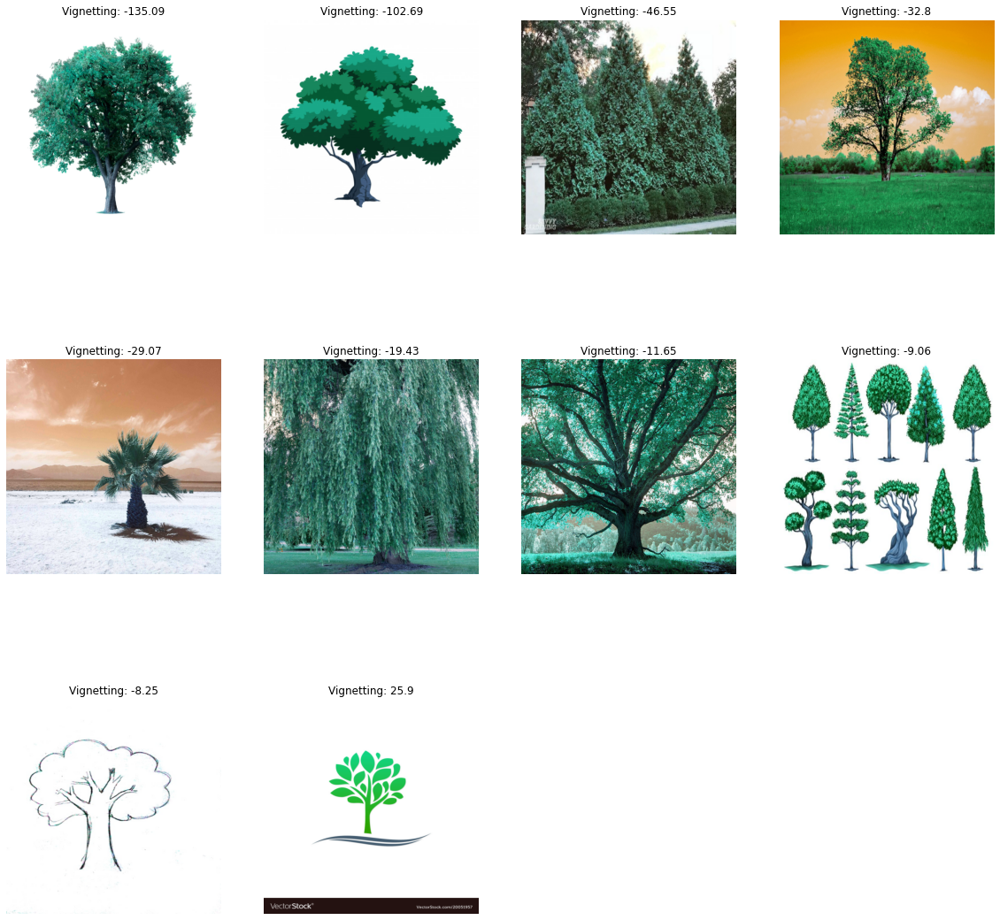

In [50]:
# Measure vignetting
imgs_hsv = [cv.cvtColor(img, cv.COLOR_BGR2HSV) for img in imgs]

# Calculate vignetting as difference between the brightness of image center and corners
vignetting_hsv = []
for img in imgs_hsv:
    corner_brightness = (img[:, :, 2][:100, :100].mean() + img[:, :, 2][:100, -100:].mean() + img[:, :, 2][-100:, :100].mean() + img[:, :, 2][-100:, -100:].mean()) / 4
    center_brightness = img[:, :, 2][100:-100, 100:-100].mean()
    vignetting_hsv.append(round(center_brightness - corner_brightness, 2))
vignetting_score = [(imgs[i], vignetting_hsv[i]) for i in range(len(imgs))]
vignetting_score.sort(key=takeSecond)

plt.figure(figsize=(20, 20))
for i, elem in enumerate(vignetting_score, 1):
    ax = plt.subplot(3, 4, i)
    img, score = elem
    plt.imshow(img)
    plt.title("Vignetting: " + str(score))
    plt.axis("off")

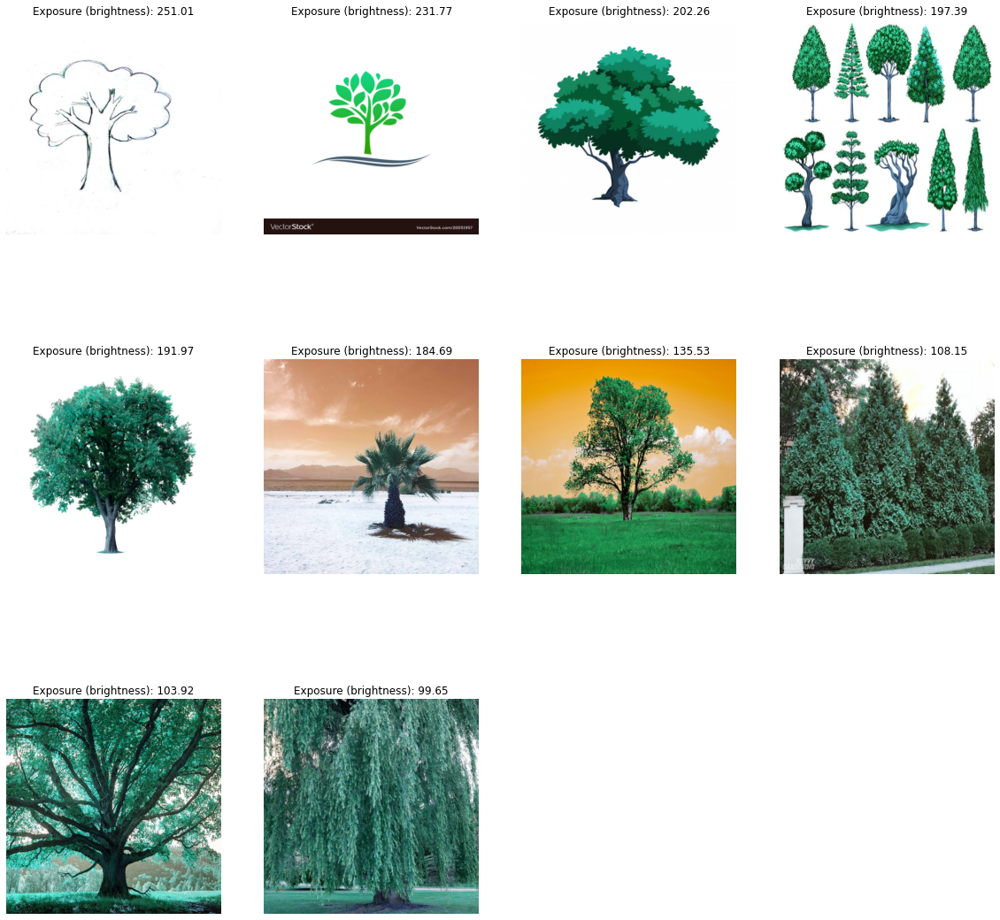

In [60]:
# Measure exposure accuracy
def pixel_brightness(pixel):
    r, g, b = pixel
    return math.sqrt(0.299 * r ** 2 + 0.587 * g ** 2 + 0.114 * b ** 2)

def image_brightness(Image):
    nr_of_pixels = len(Image) * len(Image[0])
    brightness_total = 0
    for row in Image:
        for pixel in row:
            brightness_total += pixel_brightness(pixel)
    return brightness_total / nr_of_pixels

brightness = [(img, round(image_brightness(img), 2)) for img in imgs]
brightness.sort(key=takeSecond, reverse=True)

plt.figure(figsize=(20, 20))
for i, elem in enumerate(brightness, 1):
    ax = plt.subplot(3, 4, i)
    img, score = elem
    plt.imshow(img)
    plt.title("Exposure (brightness): " + str(score))
    plt.axis("off")

In [65]:
# Measure lateral chromatic aberration
pass

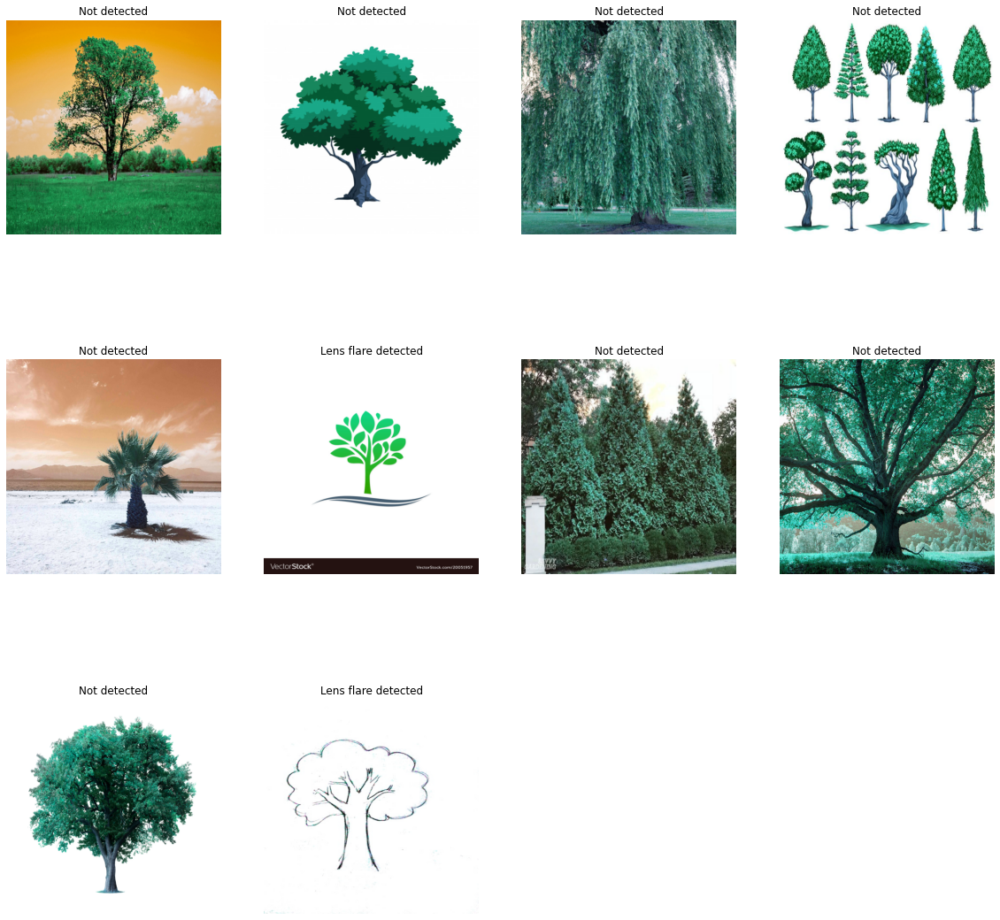

In [78]:
# Detect lens flare
def detection_of_lensflare(image):

    # blur the image to make it easier to detect objects
    blur_image = cv.medianBlur(image, 3)

    # convert the image to grayscale
    gray = cv.cvtColor(blur_image, cv.COLOR_BGR2GRAY)

    # set the lightness threshold to filter the lenflare (small blob)
    ret, thresh2 = cv.threshold(gray, 220, 255, cv.THRESH_BINARY_INV)

    img = thresh2

    # use canny to detect the lens flare edge
    imgray = cv.Canny(img, 600, 100, 3)

    # set the threshold
    ret, thresh = cv.threshold(imgray, 127, 255, cv.THRESH_BINARY)

    # find the lensflare contour
    image, contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
    for cnt in contours:
        # set the fit number
        if len(cnt) > 150:
            S1 = cv.contourArea(cnt)
            ell = cv.fitEllipse(cnt)
            S2 = math.pi*ell[1][0]*ell[1][1]
            if (S1/S2) > 0.2 and ell[1][0] / ell[1][1] < 2 and ell[1][1] / ell[1][0] < 2:
                # lensflare
                return True
    # no lensflare
    return False

hasLensFlare = [False for i in range(len(imgs))]
for i, img in enumerate(imgs):
    img_hls = cv.cvtColor(img, cv.COLOR_BGR2HLS)
    h, l, s = cv.split(img_hls)
    if np.mean(l) > 200:
        hasLensFlare[i] = True
    else:
        hasLensFlare[i] = detection_of_lensflare(img)

plt.figure(figsize=(20, 20))
for i, elem in enumerate(hasLensFlare, 1):
    ax = plt.subplot(3, 4, i)
    plt.imshow(imgs[i - 1])
    if elem:
        plt.title("Lens flare detected")
    else:
        plt.title("Not detected")
    plt.axis("off")

In [79]:
# Detect moiré pattern
pass

In [80]:
# Measure artifact
pass